<a href="https://colab.research.google.com/github/j-c-stuifbergen/machine-learning-for-physicists/blob/master/05_tutorial_tSNE_with_options.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Dimensionality Reduction via t-SNE

Example code for the lecture series "Machine Learning for Physicists" by Florian Marquardt

Lecture 5, Tutorial (this is discussed in session 5)

See https://machine-learning-for-physicists.org and the current course website linked there!



The following python code for t-SNE is an original code by the inventor of t-SNE, Laurens van der Maaten. It is available on his website https://lvdmaaten.github.io/tsne/ . 

It is stated on that website: "*You are free to use, modify, or redistribute this software in any way you want, but only for non-commercial purposes. The use of the software is at your own risk; the authors are not responsible for any damage as a result from errors in the software.*"

In [111]:
import numpy as np

from mpl_toolkits import mplot3d
from mpl_toolkits.mplot3d import axes3d
import matplotlib.pyplot as plt # for plotting
import matplotlib

matplotlib.rcParams['figure.dpi']=300 # highres display

# for updating display 
# (very simple animation)
from IPython.display import clear_output

In [112]:
#
#  tsne.py
#
# Implementation of t-SNE in Python. The implementation was tested on Python
# 2.7.10, and it requires a working installation of NumPy. The implementation
# comes with an example on the MNIST dataset. In order to plot the
# results of this example, a working installation of matplotlib is required.
#
# The example can be run by executing: `ipython tsne.py`
#
#
#  Created by Laurens van der Maaten on 20-12-08.
#  Copyright (c) 2008 Tilburg University. All rights reserved.

# note by FM: For this notebook, the MNIST example was dropped

def Hbeta(D=np.array([]), beta=1.0):
    """
        Compute the perplexity and the P-row for a specific value of the
        precision of a Gaussian distribution.
    """

    # Compute P-row and corresponding perplexity
    P = np.exp(-D.copy() * beta)
    sumP = sum(P)
    H = np.log(sumP) + beta * np.sum(D * P) / sumP
    # D contains the distances to the neighbours (more or less)
    # H is a measure for the number or relevant neighbours.
    # if beta is small, H will be big and 
    # many neighbours will be considered relevant.

    # The second term of H is a weighted average of D,
    # that weights mainly small components of D.
    # If beta is not too small, the second term ~~ (-min(D)) * beta
    #
    # To the first term, mainly the smallest components of D contribute.
    # I will write Nb for the number of sufficiently small components.
    # If beta is not too small,
    # sumP ~~ Nb * np.exp(-min(D)*beta) and 
    # np.log(sumP) ~~ np.log(Nb) + min(D)*beta
    # 
    # Then H ~~ np.log(Nb)
    #
    # If I write E(D) for np.sum(D * P) / sumP
    # The derivative dH/dbeta = - beta E((E(D)-D)^2)

    P = P / sumP
    return H, P, sumP

def colorscale(dataRow, rMin=20,rMax=20, gMin=80, gMax=255,
               bMin=20, bMax=255, opMin=150,opMax=150):

    dataMin = np.min(dataRow)
    dataMax = np.max(dataRow)

    colors = []

    for value in dataRow:
      t = (value-dataMin) / (dataMax-dataMin)

      colors.append( '#%02x%02x%02x%02x'% 
                    (int(round(t*rMax+(1-t)*rMin)), int(round(t*gMax+(1-t)*gMin)),
                     int(round(t*bMax+(1-t)*bMin)), int(round(t*opMax+(1-t)*opMin))))

    return colors

def plotLines3D(lineSizes, data, xValues=np.array([]), yValues=np.array([]),
                 ordering=np.array([]),
                zlabel="value", xLabel="iterations", lineLabel="sample id",
                titel = "",
                colors = []):
    ''' 
    lineSizes[i] contains the number of data points of line i
    data[i, lineSizes[i]] contains the z-values to be plotted
    '''

    if 0==len(colors) :
      colors = colorscale(np.arange(lineSizes.size))

    ordering = np.arange(lineSizes.size) if 0==ordering.size else ordering


    fig = plt.figure()
    ax = plt.axes(projection='3d')
    for j in range(lineSizes.size):
      i = ordering[j]
      # by default, draw first lines at the back
      yline = np.ones(lineSizes[i],dtype=int)*(lineSizes.size-j) if \
          0==yValues.size else yValues[i,0:lineSizes[i]]
      xline = np.arange(lineSizes[i],dtype=int) if \
          0==xValues.size else xValues[i,0:lineSizes[i]]

      xordering = xline.argsort()
      zline = data[i,0:lineSizes[i]]
      ax.plot3D(xline[xordering], yline[xordering], zline[xordering], colors[i])
      ax.set_zlabel(zlabel)
      ax.set_xlabel(xLabel)
      ax.set_ylabel(lineLabel)
      ax.set_title(titel if 0==len(titel) else zlabel)
    
    return ax

def x2p_with_plot(X=np.array([]), colorLabels=np.array([]), perplexity=30.0, nLines = 100):

    (P, tries, beta_data, sumP_data, H_data) = \
      x2p(X, perplexity=perplexity)

    print("tries size is "+str(tries.size))
    print("tries max is "+str(np.max(tries)))
    print("tries min is "+str(np.min(tries)))
    if tries.size<nLines:
      nLines = tries.size
    print("I will show "+str(nLines)+" lines")
    # limit the number of lines, so the graph will not be cluttered
    tries=tries[0:nLines] 
    foundBetas = np.zeros((tries.size,2))
    foundHs = np.zeros((tries.size,2))
    for i in range(tries.size):
      foundBetas[i,:]=[int(i),beta_data[i,tries[i]]]
      foundHs[i,:]=[int(i),H_data[i,tries[i]]]
    
    ordering = foundBetas[:,1].argsort()

    # colors = colorscale(np.arange(tries.size),  gMin=20,gMax=255, bMin=80,bMax=255)
    colors = colorscale(tries,  gMin=20,gMax=255, bMin=255,bMax=20)
    if 0==colorLabels.size:
      colorsKind=colors
    else:
      colorsKind = colorscale(colorLabels,  rMin=255,rMax=20,  gMin=20,gMax=255, bMin=80,bMax=255)

    lnBeta_data = np.zeros(beta_data.shape)
    for i in range(tries.size):
      for j in range(tries[i]):
        lnBeta_data[i,j] = np.log(beta_data[i,j])
    plotLines3D(lineSizes=tries, data=H_data, zlabel="H",xLabel="iterations", lineLabel="i")
    plotLines3D(lineSizes=tries, ordering=ordering, data=lnBeta_data, 
                colors=colorsKind, 
                zlabel="ln(beta)",xLabel="iterations", lineLabel="i")
    plotLines3D(lineSizes=tries, ordering=ordering, data=H_data, colors=colorsKind,
                zlabel="H",xLabel="iterations", lineLabel="i")
    
    ax = plotLines3D(lineSizes=tries, ordering=ordering, data=H_data, xValues=lnBeta_data,
                colors=colorsKind,
                zlabel="H",xLabel="ln (Beta)", lineLabel="i")
    ax.view_init(0,90)

    plt.show()
    fig,ax=plt.subplots(ncols=2,nrows=2,figsize=(10,5))

    ax[0,1].hist(tries,np.arange(np.min(tries)-0.5,np.max(tries)+0.5))
    ax[0,0].plot(-np.log(beta_data[i,0:tries[i]]),color="purple")
    ax[0,0].plot(np.log(sumP_data[i,0:tries[i]]),color="green")
    ax[0,0].plot(H_data[i,0:tries[i]],color="orange")

    skip1 = 5
    ax[1,0].plot(-np.log(beta_data[i,skip1:tries[i]]),color="purple")
    ax[1,0].plot(np.log(sumP_data[i,skip1:tries[i]]),color="green")
    ax[1,0].plot(H_data[i,skip1:tries[i]],color="orange")
    
    """skip1 = 15
    ax[1,1].plot(-np.log(beta_data[i,skip1:tries[i]]),color="purple")
    ax[1,1].plot(np.log(sumP_data[i,skip1:tries[i]]),color="green")
    ax[1,1].plot(H_data[i,skip1:tries[i]],color="orange")
    """
    ordering = foundBetas[:,1].argsort()

    ax[1,1].plot(foundHs[ordering,1],np.log(foundBetas[ordering,1]),color="blue")
    ax[1,1].set_ylabel("ln(Beta)")
    ax[1,1].set_xlabel("H")

    plt.show()

    return P # , tries, beta_data, sumP_data, H_data

def x2p(X=np.array([]), tol=1e-5, perplexity=30.0):
    """
        Performs a binary search to get P-values in such a way that each
        conditional Gaussian has the same perplexity.
    """
   
    # Initialize some variables
    print("Computing pairwise distances...")
    (n, d) = X.shape
    sum_X = np.sum(np.square(X), 1)
    D = np.add(np.add(-2 * np.dot(X, X.T), sum_X).T, sum_X)
    P = np.zeros((n, n))
    beta = np.ones((n, 1))
    logU = np.log(perplexity)
    maxTries = 50 
    tries = np.ones(n,dtype=int)
    H_data = np.zeros((n,maxTries+1))
    beta_data = np.zeros((n,maxTries+1))
    sumP_data = np.zeros((n,maxTries+1))
    
    print("perplexity = e^(%f)" % logU)
    # Loop over all datapoints
    for i in range(n):

        # Print progress
        if i % 500 == 0:
            print("Computing P-values for point %d of %d..." % (i, n))

        # Compute the Gaussian kernel and entropy for the current precision
        betamin = -np.inf
        betamax = np.inf
        Di = D[i, np.concatenate((np.r_[0:i], np.r_[i+1:n]))]
        
        while True:
          (H, thisP, thisSum) = Hbeta(Di, beta[i])
          Hdiff = H - logU
          beta_data[i,tries[i]] = beta[i]
          sumP_data[i,tries[i]] = thisSum
          # H_data[i,tries[i]] = H-thisSum
          H_data[i,tries[i]] = H # -thisSum
          
          # Evaluate whether the perplexity is within tolerance
          if np.abs(Hdiff) <=tol :
            break

          if maxTries <= tries[i]:
            break

          tries[i] += 1

          # If not, increase or decrease precision
          if Hdiff > 0:
              betamin = beta[i].copy()
              if betamax == np.inf or betamax == -np.inf:
                  beta[i] = beta[i] * 2.
              else:
                  beta[i] = (beta[i] + betamax) / 2.
          else:
              betamax = beta[i].copy()
              if betamin == np.inf or betamin == -np.inf:
                  beta[i] = beta[i] / 2.
              else:
                  beta[i] = (beta[i] + betamin) / 2.

        # Set the final row of P
        P[i, np.concatenate((np.r_[0:i], np.r_[i+1:n]))] = thisP

    # Return final P-matrix
    print("Mean value of sigma: %f" % np.mean(np.sqrt(1 / beta)))

    return P, tries, beta_data, sumP_data, H_data


def pca(X=np.array([]), no_dims = 0):
    """
        Runs PCA on the NxD array X in order to reduce its dimensionality to
        no_dims dimensions.
    """

    print("Preprocessing the data using PCA...")
    (n, d) = X.shape
    if 0==no_dims:
      no_dims = d
    X = X - np.tile(np.mean(X, 0), (n, 1))
    (l, M) = np.linalg.eig(np.dot(X.T, X))
    Y = np.dot(X, M[:, 0:no_dims])
    return Y


def tsne(X=np.array([]), no_dims=2, P=np.array([]), perplexity=30.0,
         do_animation=False, animation_skip_steps=10, max_iter = 1000,  initial_dims=50, ):
    # Check inputs
    if isinstance(no_dims, float):
        print("Error: number of dimensions should be an integer.")
        return -1
    if round(no_dims) != no_dims:
        print("Error: number of dimensions should be an integer.")
        return -1
    (n, d) = X.shape
    Ystart = np.random.randn(n, no_dims)
    
    return tsne_XY(X, Ystart, P=P, do_animation=do_animation,
                   animation_skip_steps=animation_skip_steps, max_iter=max_iter) 


def tsne_XY(X=np.array([]), Y=np.array([]), P=np.array([]), perplexity=30.0, 
         do_animation=False, animation_skip_steps=10, max_iter = 1000,
         exag=[[4,100]],
         use_rhos = True, eta2 = 100, normalizeRows = False,
         useGravityFactor=True, symmetrizeP=True, transposeP=False):
    """
        Runs t-SNE on the dataset in the NxD array X to reduce its
        dimensionality to no_dims dimensions. The syntaxis of the function is
        `Y = tsne.tsne(X, no_dims, perplexity), where X is an NxD NumPy array.
        
        Added by F. Marquardt: do_animation==True will give you a graphical animation of
        the progress, use animation_skip_steps to control how often this will
        be plotted; max_iter controls the total number of gradient descent steps
    """

    # Initialize variables
    (n, d) = X.shape
    (nY, no_dims) = Y.shape    

    # Check inputs
    if nY != n:
      print("Error: the first dimension of Y and X should be identical.")
      return -1
    if d<no_dims:
      print("Error: the second dimension of Y should not exceed the dimension of X.")
      return -1

    # PCA doesn't significantly change the distances (apart from roundoff errors)
    # so it doesn't change P significantly
    # X = pca(X).real
    initial_momentum = 0.5
    final_momentum = 0.8

    exag.append([1,0]) # last value of exaggeration should be 1
    exagCounter = 0
    exaggeration = exag[exagCounter][0] # =4
    logExag = np.log(exaggeration)
    
    rowAverage =1
    if normalizeRows:  # makes rows of PQ a factor n bigger
      eta2 = eta2/n
    if not useGravityFactor: # this factor is, on average, 1/n
      eta2 = eta2/n
      # but the number of non-neglectable elements is not much different from the perplexity
      # eta2 = eta2/(4*perplexity)
    eta = 5 * eta2 # eta = 500
    # eta2 = eta * 0.2
    
    min_gain = 0.01
    min_rho = 0.05 * eta2 # = min_gain*eta 
    dY = np.zeros((n, no_dims))
    iY = np.zeros((n, no_dims))
    gains = np.ones((n, no_dims))
    rhos = np.ones((n, no_dims)) * eta

    # Compute P-values
    if 0==P.size: 
      (P, tries, beta_data, sumP_data, H_data) = \
        x2p(X, perplexity=perplexity)
    if symmetrizeP:
      P = (P + np.transpose(P)) / 2
      # 2*n = np.sum(P) #  should be the same as P = P/( 2* n)
    # else:
      #  np.sum(P) = n
    if not normalizeRows:
      P=P/np.sum(P)
    
    PEnd = P

    P = PEnd * exaggeration							# early exaggeration
    P = np.maximum(P, 1e-12)

    if do_animation: # added by FM
        costs=np.zeros(max_iter) # to store the cost values
                
    # Run iterations
    for iter in range(max_iter):

        # Compute pairwise affinities
        sum_Y = np.sum(np.square(Y), 1)
        num = -2. * np.dot(Y, Y.T)
        d = ( np.add(np.add(num, sum_Y).T, sum_Y))
        num = 1. / (1. + d)
        # num = 1. / (1. + np.add(np.add(num, sum_Y).T, sum_Y))
        num[range(n), range(n)] = 0.
        if normalizeRows:
          Q=np.zeros((n,n))
          for i in range(n):
            Q[i,:]= num[i,:]/np.sum(num[i,:])
        else:
          Q = num / np.sum(num)
        Q = np.maximum(Q, 1e-12)

        # Compute gradient
        PQ = P - Q
        for i in range(n):
            # Note that Y.shape = (n,no_dims) and Y[i,:].shape = (no_dims).
            # Usually, no_dims = 2
            # Q and num are symmetric matrices
            # P and PQ are not symmetric
            # In practice, P is almost symmetric.
            # In practice, PQ is almost symmetric.
            # IF P has not been symmetrized,
            # 1 = np.sum(P[i,:]) but np.sum(P[:,i]) can be different
            # Then we should use PQ[i,:] in stead of PQ[:,i].
            # of course, moving Y[j,:] or Y[k,:] has the same effect on Q[j,k]
            # But if P[j,k] < P[k,j] , 
            # it is likely that the other elements of P[j,:] are bigger than 
            # the other elements of P[k,:],
            # so it is likely that a change in Y[k,:] has 
            # less impact on other elements of Q[:,:].
            # So if P[j,k] < P[k,j], I want to use P[k,j] to move Y[k,:]
            # and P[j,k] to move Y[j,:] (hopefully less) 

            # a vector times a matrix is a vector
            # Y[i,:] is replicated to fit the dimensions of Y= Y[:,:]
            # multiplication by num[i,:] means that when two 
            # elements of Y are near, they will be moved faster
            # This may seem unstable, but moves points away that should go away.

            if transposeP:
              row = PQ[:,i]
            else:
              row = PQ[i,:]
            if useGravityFactor: # this is the original version, for symmetrized P
              dY[i, :] = np.matmul( (row * num[:,i]),(Y[i, :] - Y))
            else: # average value of num = 1/(n*n)
              dY[i, :] = np.matmul( (row  ),(Y[i, :] - Y)) # less stable for symmetric P
            
            
            """ There are alternative ways to write the calculation:
            # python doesn't distinguish between row vectors and column vectors
            dY[i, :] = np.matmul((Y[i, :] - Y).T , (PQ[i,:] * num[i,:]))

            # The original author created 2 matrices
            # the "*" operator multiplies element-wise
            dY[i, :] = np.sum(np.tile(PQ[:, i] * num[:, i], (no_dims, 1)).T * (Y[i, :] - Y), 0)
            
            # "None" adds a dimension, making PQ[i,:,None].shape = (n,1)
            # this is replicated to fit  (Y[i, :] - Y) before "*" is executed
            # dY[i, :] = np.sum((PQ[i,:,None] * num[i,:,None]) * (Y[i, :] - Y), 0)
            """

        # Perform the update
        if iter < 20 and iter*5 < max_iter:
            momentum = initial_momentum  # = 0.5 
        else:
            momentum = final_momentum   # = 0.8
        if not use_rhos: # original algorithm
          gains = (gains + 0.2) * ((dY > 0.) != (iY > 0.)) + \
                  (gains * 0.8) * ((dY > 0.) == (iY > 0.))
          gains[gains < min_gain] = min_gain
          iY = momentum * iY - eta * (gains * dY)
        else: #The parameter "0.2" is now included in eta2
          # apart from round-off, the result is the same.
          rhos = (rhos + eta2) * ((dY > 0.) != (iY > 0.)) + \
                (rhos * 0.8) * ((dY > 0.) == (iY > 0.))
          rhos[rhos < min_rho] = min_rho
          iY = momentum * iY - (rhos * dY)
        Y = Y + iY
        Y = Y - np.tile(np.mean(Y, 0), (n, 1))

        # C = np.sum(P * (np.log(P / Q) )) # indication of the quality of the solution
        # But a better measure for the quality of the algorithm is:
        C = np.sum(P * (np.log(P / Q) - logExag)) / exaggeration 

        if not do_animation: # added by FM: do not print if we are animating!
            # Compute current value of cost function
            if (iter + 1) % 10 == 0:
                # C = np.sum(P * np.log(P / Q))
                print("Iteration %d: error is %f" % (iter + 1, C), end="\r") # modified to overwrite line

        if do_animation:  # added by FM
            # compute for every step, to store it in 'costs'
            costs[iter]=C
            if iter % animation_skip_steps==0 or iter+1==max_iter:
                clear_output(wait=True)
                fig,ax=plt.subplots(ncols=2,nrows=1,figsize=(10,5))
                ax[0].plot(costs)
                ax[1].scatter(Y[:,0],Y[:,1],color="orange")
                plt.show()

        if 1!=exaggeration:
          if iter == exag[exagCounter][1] or max_iter <= iter * 2 :
            exagCounter += 1
            exaggeration = exag[exagCounter][0]
            logExag = np.log(exaggeration)
            P = PEnd * exaggeration
            P = np.maximum(P, 1e-12)
                        
    # Return solution
    return Y
    



# Example 1: A few Gaussian clouds in high-dimensional space

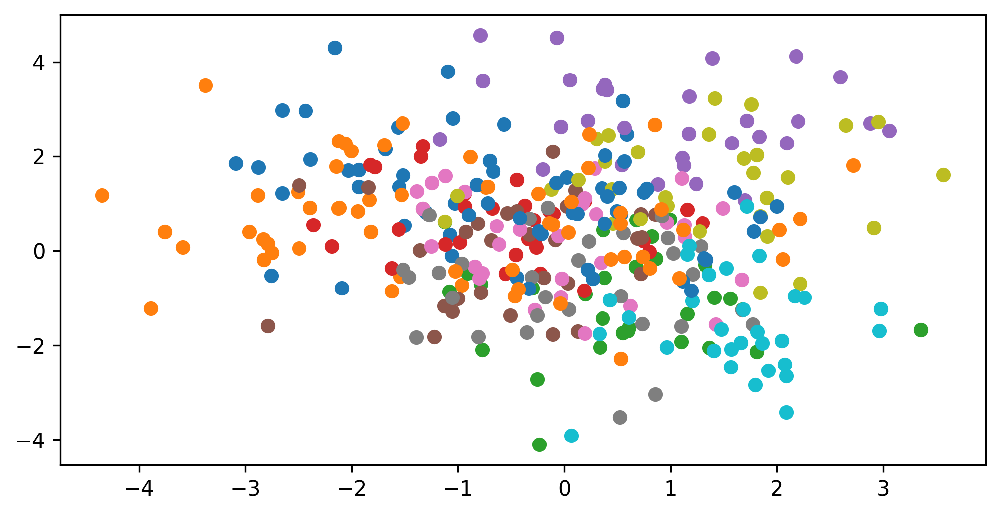

In [113]:
# produce a high-dimensional data set, composed of a few Gaussian point clouds in high-dimensional space

n_dim=100 # a really high-dimensional space
n_dim=5 # if n_dim ==5, the algorithm seems to fail
n_dim = 100
n_clusters=12 # number of clusters, i.e. clouds
N_cluster_points=30 # number of points inside each cluster
N=n_clusters*N_cluster_points # total number of points

Gauss_spread=1.0 # size of each cluster (cloud)

X=np.zeros([N,n_dim])

for j in range(n_clusters):
    Xmean=np.random.randn(n_dim) # the center position of the cluster
    X[j*N_cluster_points:(j+1)*N_cluster_points,:]=Xmean[None,:]+Gauss_spread*np.random.randn(N_cluster_points,n_dim)

"""
# now make the first cluster far from the other clusters
# this may make P non-symmetric, but the effect is neglectable...
for j in range(1):
    Xmean=np.ones(n_dim)*5 # make it far from the other clusters
    X[j*N_cluster_points:(j+1)*N_cluster_points,:]=Xmean[None,:]+Gauss_spread*np.random.randn(N_cluster_points,n_dim)
"""

# now make the first cluster nearer to some other clusters
# this may make P non-symmetric, but the effect is neglectable...
n_examples = 2
n_imitations = 2
"""
if n_clusters<n_examples+n_imitations :
  raise ValueError('too many examples or too many imitations, or too few clusters')
else:
    j=0
    for i in range(n_imitations):
      if 0== n_dim%n_examples:
        j+=1
      for k in range(n_dim):
        if j==n_examples:
          j=0  
        X[i*N_cluster_points:(i+1)*N_cluster_points,k]=X[(n_imitations+j)*N_cluster_points:(n_imitations+j+1)*N_cluster_points,k]
        j+=1
"""
# plot these points in a projection into 2D space
# color them according to the cluster they belong to!

plt.figure(figsize=(8,4))
for j in range(n_clusters):
    X0=X[j*N_cluster_points:(j+1)*N_cluster_points,0]
    X1=X[j*N_cluster_points:(j+1)*N_cluster_points,1]    
    plt.scatter(X0,X1)
plt.show()

colors = colorscale(range(n_imitations), rMin=150,rMax=255, gMin=20, gMax=20,
               bMin=20, bMax=20, opMin=150,opMax=150)

colors.extend (colorscale(range(n_examples), rMin=20,rMax=220, gMin=150, gMax=255,
               bMin=20, bMax=20, opMin=150,opMax=150))
colors.extend (colorscale(range(n_clusters-(n_examples+n_imitations)), rMin=20,rMax=20, gMin=20, gMax=20,
               bMin=150, bMax=255, opMin=150,opMax=150))



### now calculate P

Computing pairwise distances...
perplexity = e^(3.401197)
Computing P-values for point 0 of 360...
Mean value of sigma: 5.858850
tries size is 360
tries max is 23
tries min is 13
I will show 100 lines


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:131: RuntimeWarning: divide by zero encountered in log


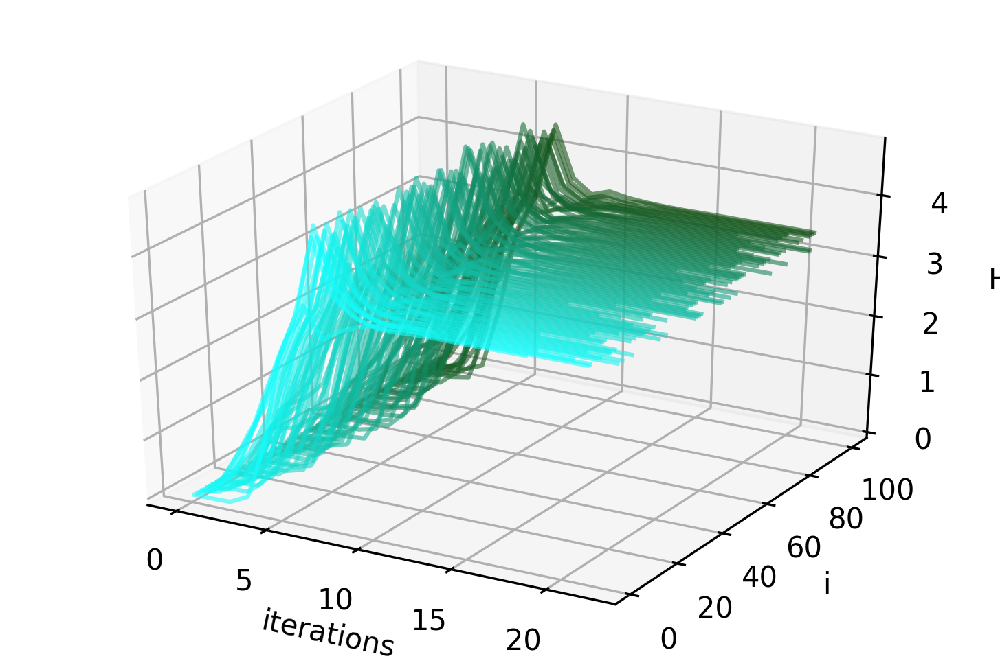

/usr/local/lib/python3.6/dist-packages/mpl_toolkits/mplot3d/proj3d.py:152: RuntimeWarning: invalid value encountered in true_divide
  txs, tys, tzs = vecw[0]/w, vecw[1]/w, vecw[2]/w


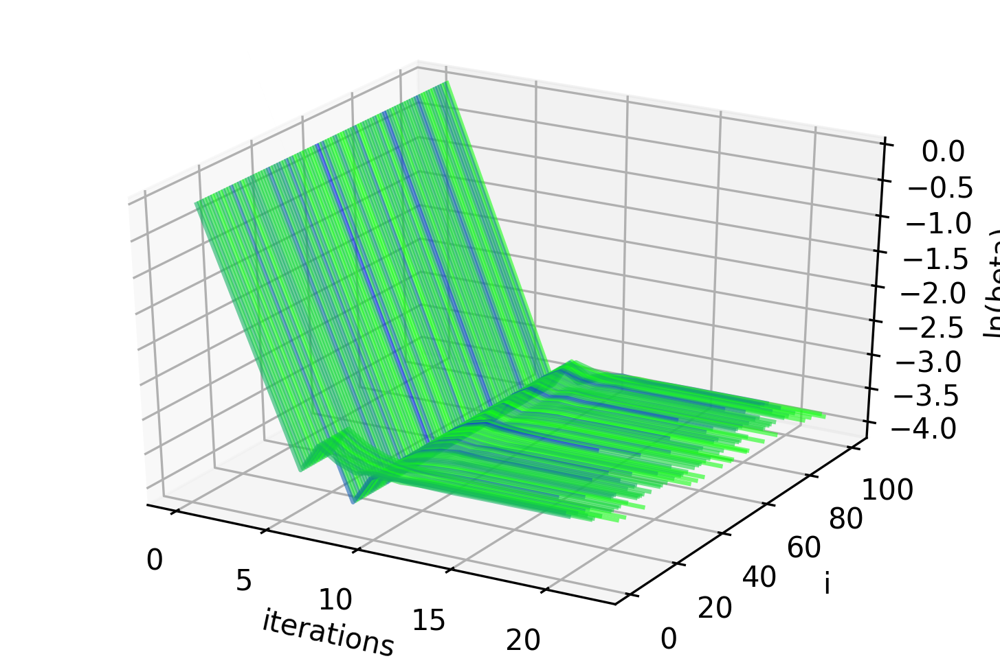

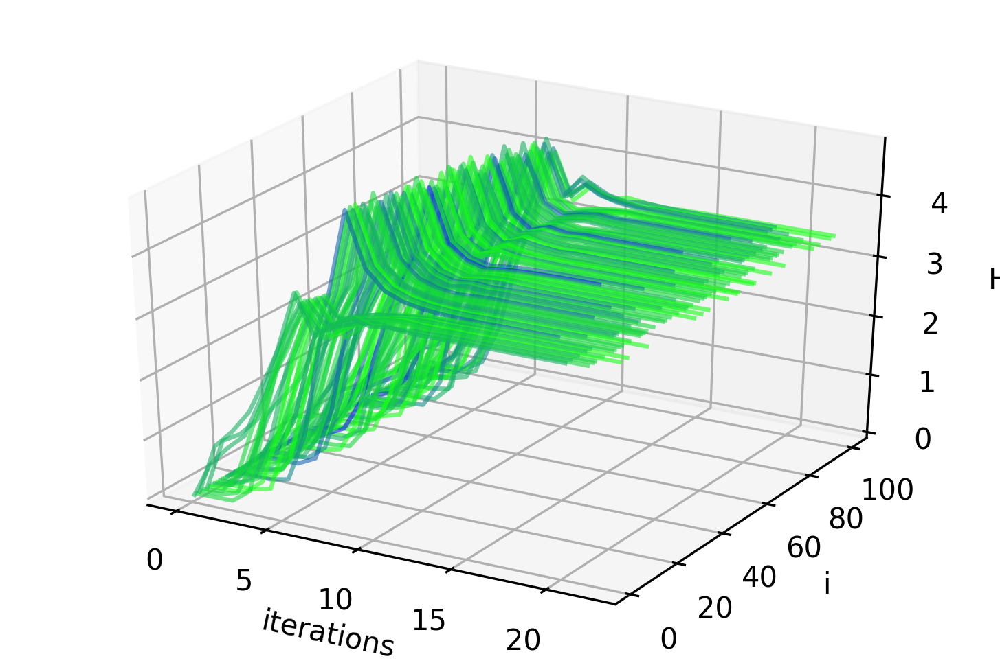

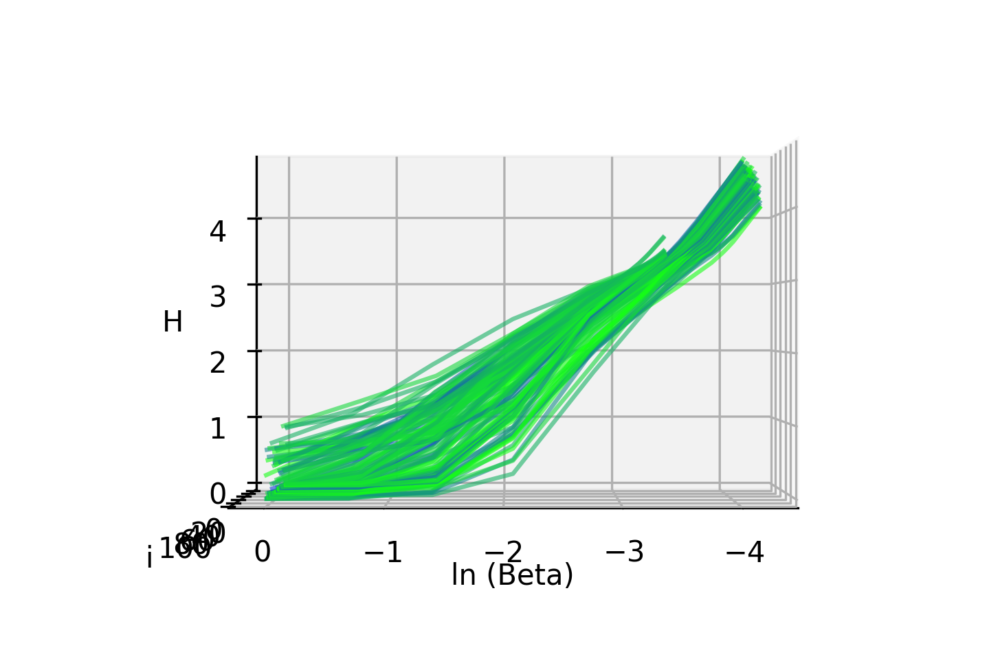

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:148: RuntimeWarning: divide by zero encountered in log
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:149: RuntimeWarning: divide by zero encountered in log


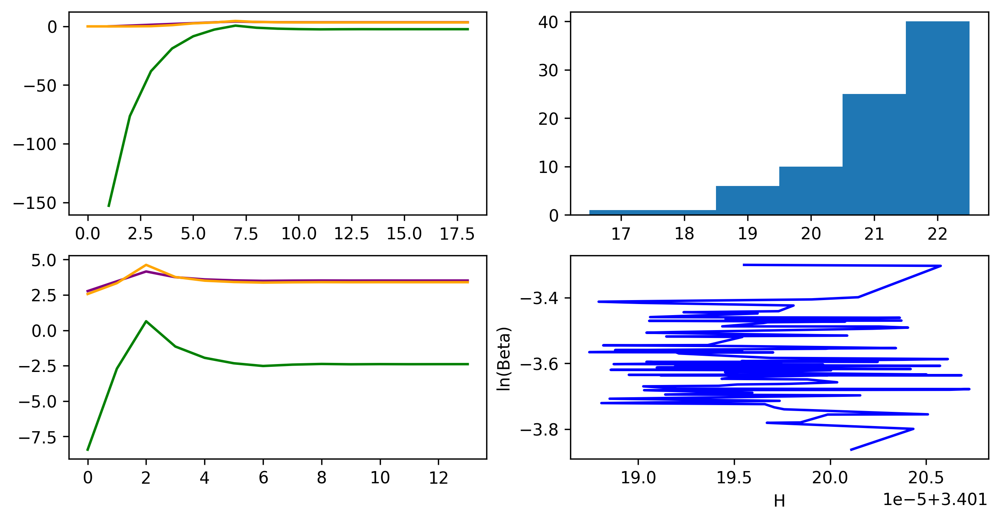

In [114]:
# now apply t-SNE to reduce tosign functiontwo dimensions in a smart way!
P = x2p_with_plot(X,perplexity=30)


## (not) traditional use of P
traditionally, useGravityFactor would be True

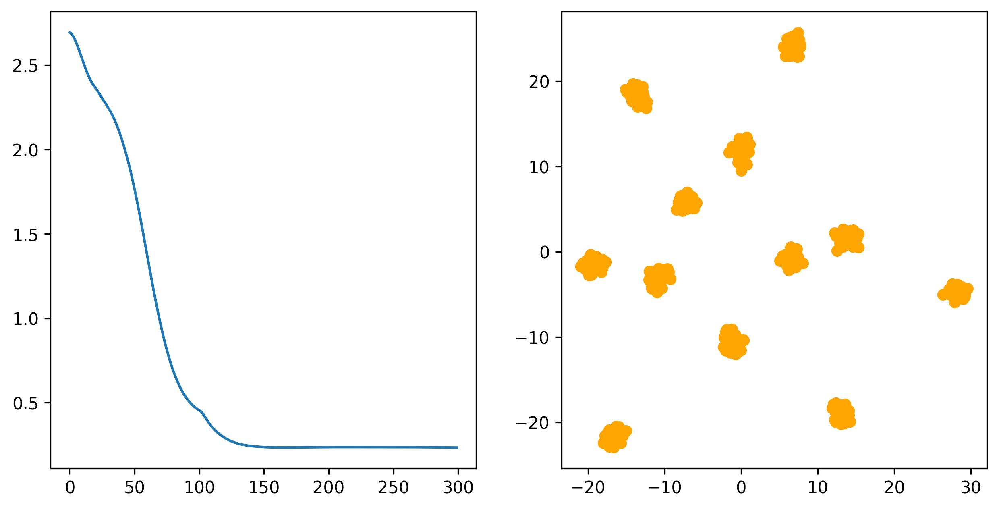

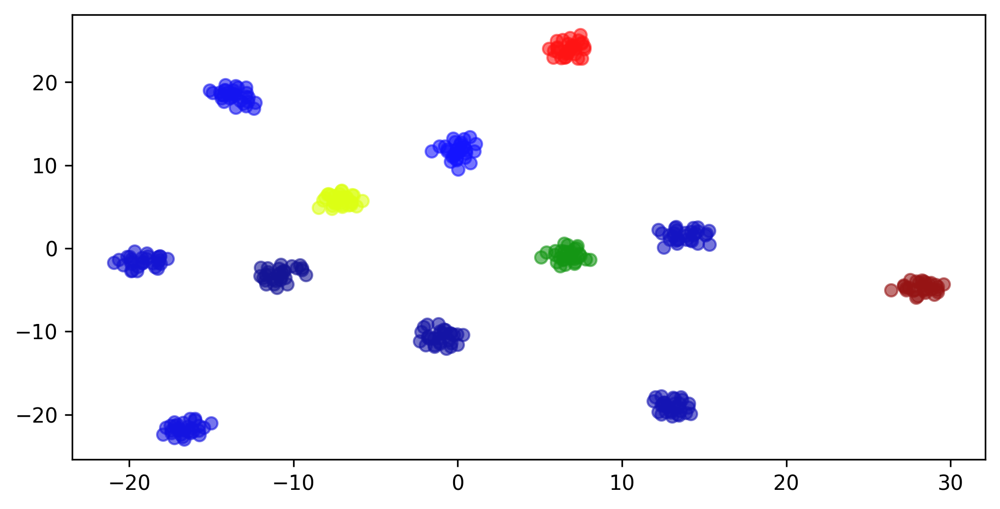

In [115]:
# Y=tsne(X, P=P, no_dims=2, perplexity=30,
#       do_animation=True, animation_skip_steps=30, max_iter=300)

target_dims = 2
Ystart = np.random.randn(X.shape[0], target_dims)
Y=tsne_XY(X, Y=Ystart, P=P, perplexity=30, eta2=100,
       do_animation=True, animation_skip_steps=30, max_iter=300,
       useGravityFactor=False, normalizeRows = False)

# plot the points according to the t-SNE projection into 2D space
# color them according to the cluster they belong to!
plt.figure(figsize=(8,4))
for j in range(n_clusters):
    Y0=Y[j*N_cluster_points:(j+1)*N_cluster_points,0]
    Y1=Y[j*N_cluster_points:(j+1)*N_cluster_points,1]    
    plt.scatter(Y0,Y1,c=colors[j])
plt.show()

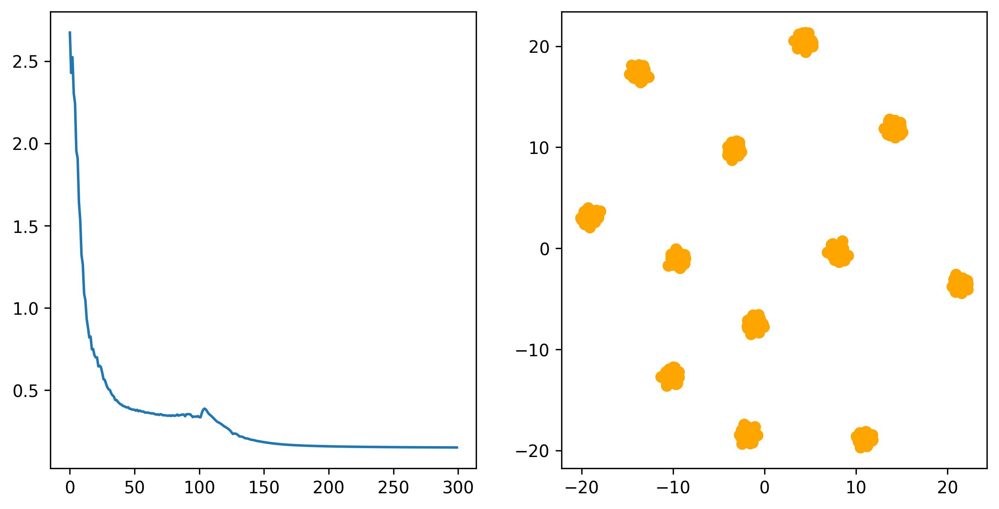

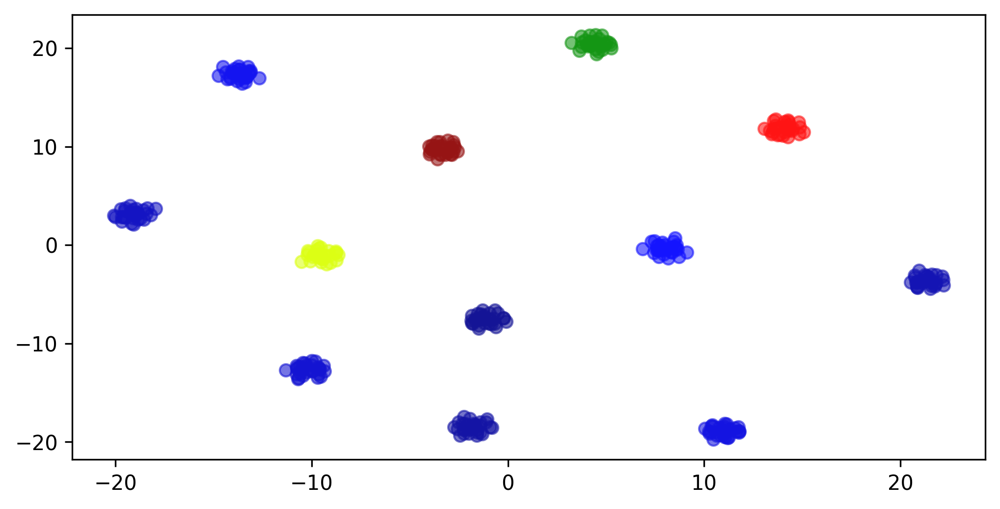

In [116]:
# Y=tsne(X, P=P, no_dims=2, perplexity=30,
#       do_animation=True, animation_skip_steps=30, max_iter=300)

target_dims = 2
Ystart = np.random.randn(X.shape[0], target_dims)
Y=tsne_XY(X, Y=Ystart, P=P, perplexity=30, eta2=100,
       do_animation=True, animation_skip_steps=30, max_iter=300,
        useGravityFactor=True, normalizeRows = False)

# plot the points according to the t-SNE projection into 2D space
# color them according to the cluster they belong to!
plt.figure(figsize=(8,4))
for j in range(n_clusters):
    Y0=Y[j*N_cluster_points:(j+1)*N_cluster_points,0]
    Y1=Y[j*N_cluster_points:(j+1)*N_cluster_points,1]    
    plt.scatter(Y0,Y1,c=colors[j])
plt.show()

Why do the clusters become flatter?

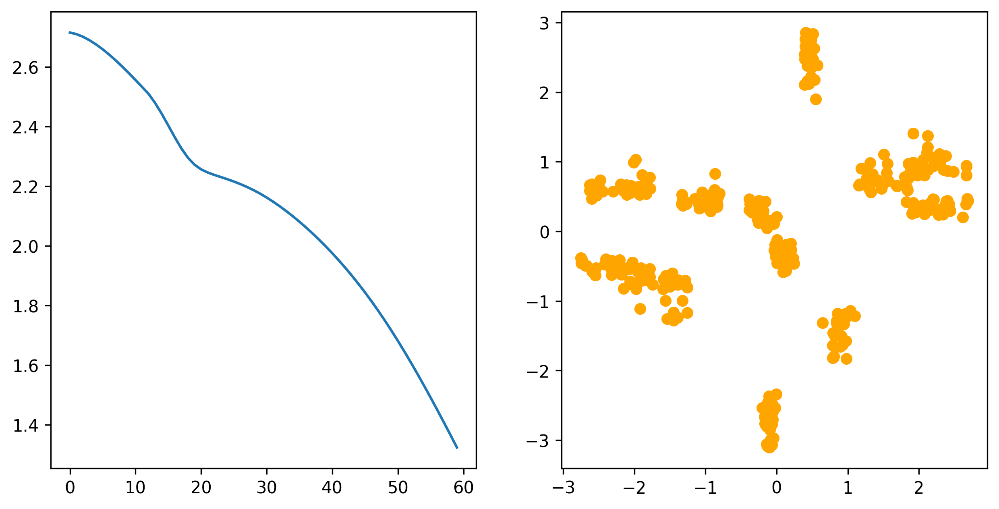

<function matplotlib.pyplot.show>

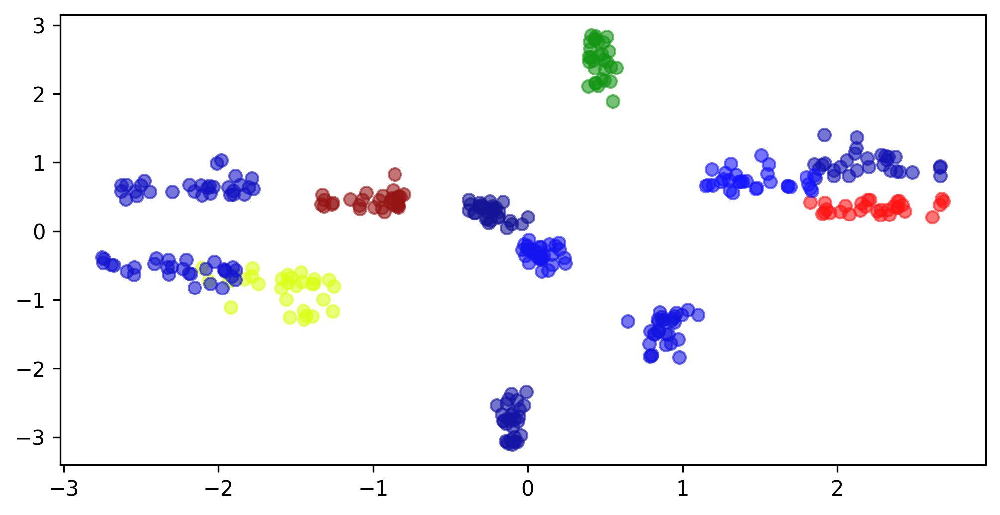

In [117]:
Y=tsne_XY(X, Y=Ystart, P=P, do_animation=True, animation_skip_steps=30,
          eta2= 100, max_iter=60, 
          useGravityFactor=False,  symmetrizeP=False)

# plot the points according to the t-SNE projection into 2D space
# color them according to the cluster they belong to!
plt.figure(figsize=(8,4))
for j in range(n_clusters):
    Y0=Y[j*N_cluster_points:(j+1)*N_cluster_points,0]
    Y1=Y[j*N_cluster_points:(j+1)*N_cluster_points,1]    
    plt.scatter(Y0,Y1, c=colors[j])
plt.show

unsymmetrized: clusters become smaller

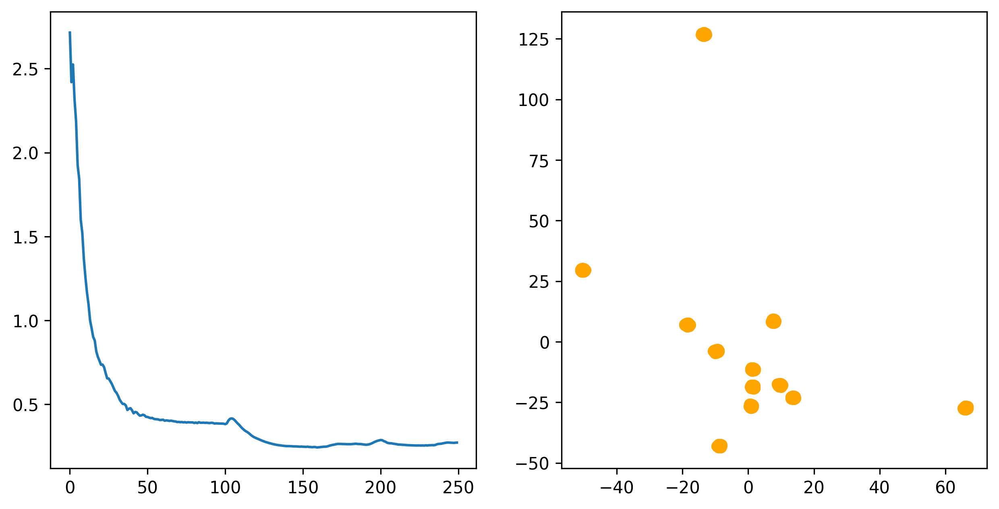

<function matplotlib.pyplot.show>

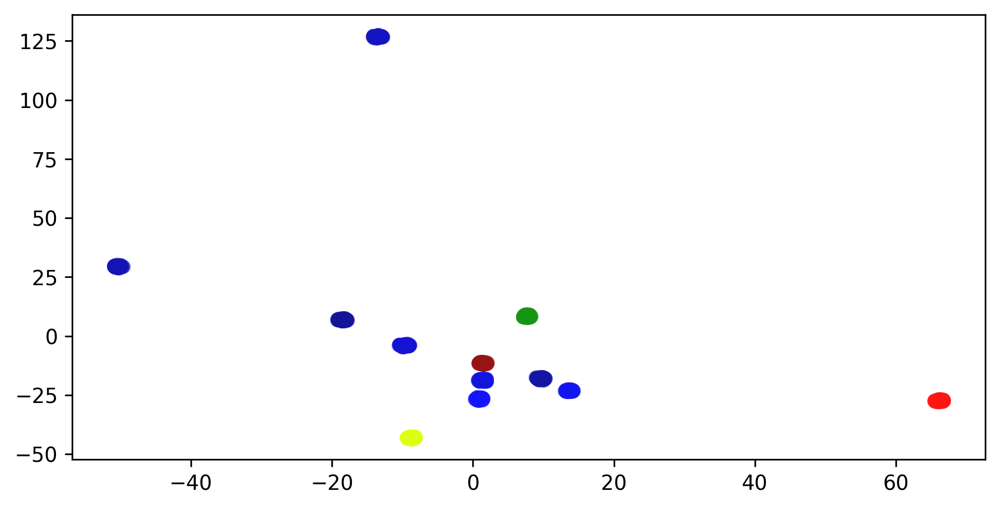

In [118]:
Y=tsne_XY(X, Y=Ystart, P=P, do_animation=True, animation_skip_steps=30,
          eta2= 100, max_iter=250, 
          useGravityFactor=True,  symmetrizeP=False)

# plot the points according to the t-SNE projection into 2D space
# color them according to the cluster they belong to!
plt.figure(figsize=(8,4))
for j in range(n_clusters):
    Y0=Y[j*N_cluster_points:(j+1)*N_cluster_points,0]
    Y1=Y[j*N_cluster_points:(j+1)*N_cluster_points,1]    
    plt.scatter(Y0,Y1, c=colors[j])
plt.show

# unsymmetrized, moving each dot by the criterium "what is best for the other dots" in stead of "what is best for me"
(transposeP=True)

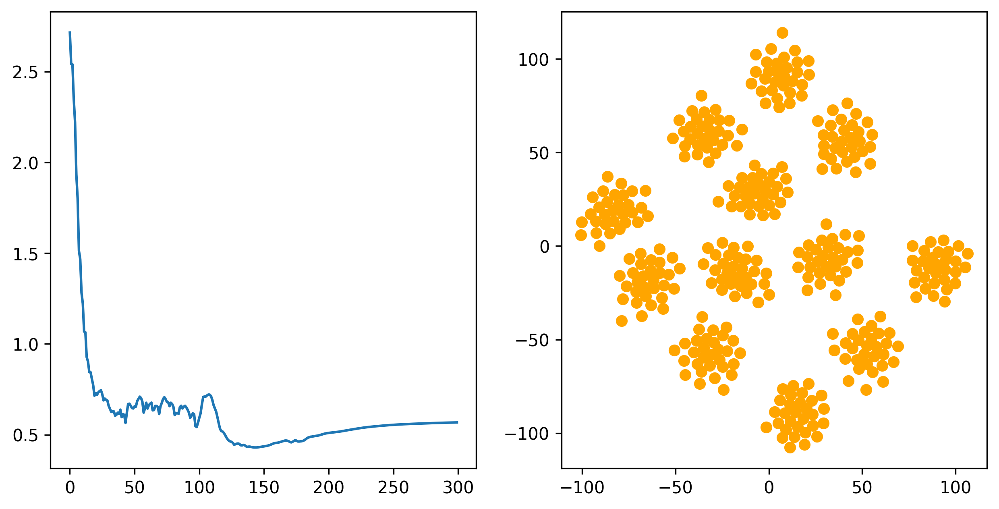

<function matplotlib.pyplot.show>

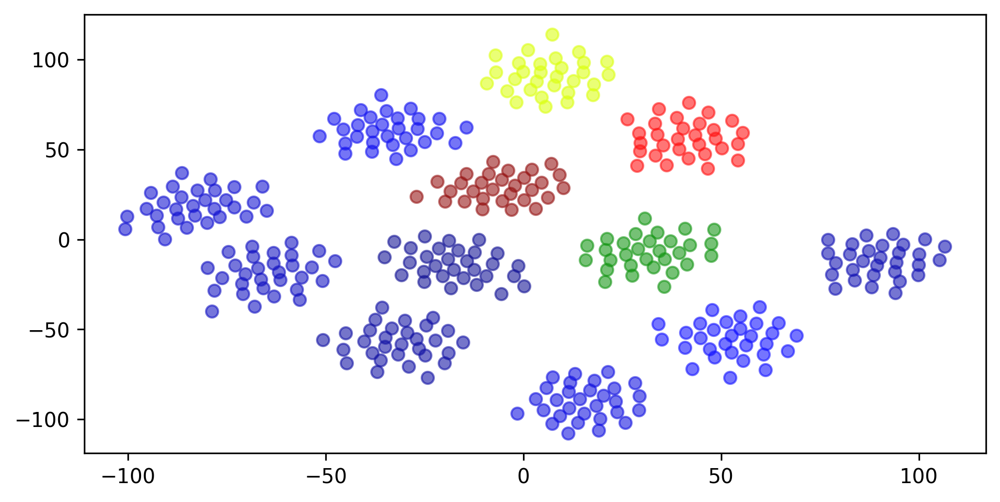

In [119]:
Y=tsne_XY(X, Y=Ystart, P=P, do_animation=True, animation_skip_steps=30,
          eta2= 100, max_iter=300, 
          useGravityFactor=True, symmetrizeP=False, transposeP=True)

# plot the points according to the t-SNE projection into 2D space
# color them according to the cluster they belong to!
plt.figure(figsize=(8,4))
for j in range(n_clusters):
    Y0=Y[j*N_cluster_points:(j+1)*N_cluster_points,0]
    Y1=Y[j*N_cluster_points:(j+1)*N_cluster_points,1]    
    plt.scatter(Y0,Y1, c=colors[j])
plt.show

# Example 2: Multiple Gaussians: finding the true number without labels!

In [120]:

# Plot a tSNE-scatterplot, but with some randomly marked points,De huisregels voorkomen niet dat s
# as curves!

def plot_tsne_with_curves(y0,y1,x,colorLabel,n_picks=10,vmin=-0.1,vmax=2, random_picks=np.array([])):
    if 0==random_picks.size:
      random_picks=np.random.randint(np.shape(y0)[0],size=n_picks) # pick some random points
    fig=plt.figure(constrained_layout=True,figsize=(8,4))
    gs=fig.add_gridspec(ncols=8,nrows=4)
    scatter_plot=fig.add_subplot(gs[0:4,0:4])
    
    myplot={}
    j=0
    for n0 in range(4):
        for n1 in range(4):
            myplot[j]=fig.add_subplot(gs[n0,4+n1])
            myplot[j].axis('off')
            j+=1
    
    scatter_plot.scatter(y0,y1,c=colorLabel)
    scatter_plot.scatter(y0[random_picks],y1[random_picks],color="black",alpha=0.7,s=80)
    
    for idx in range(len(random_picks)):
        scatter_plot.text(y0[random_picks[idx]], y1[random_picks[idx]], 
                      str(idx), fontsize=8, color="orange", 
                     alpha=0.8, horizontalalignment='center',
                verticalalignment='center')
    
    for idx,m in enumerate(random_picks):
        if idx<j:
            myplot[idx].plot(x[m,:])
            myplot[idx].text(0.1, 0.75, str(idx), fontsize=12, color="orange", 
                             alpha=0.5, horizontalalignment='center',
                        verticalalignment='center', transform=myplot[idx].transAxes)
            myplot[idx].set_ylim([vmin,vmax])
        
    plt.show()

In [121]:
def my_generator1D(batchsize,x): # produce a batch of curves, a random number of Gaussian
    maxNum=2 # the maximum number of Gaussians
    NumGaussians=np.random.randint(maxNum+1,size=batchsize) # select the number, for each sample
    Curves=np.zeros([batchsize,len(x)])
    for j in range(maxNum):
        R=np.random.uniform(low=0.1,high=0.11,size=batchsize) # width
        A=np.random.uniform(low=0.9,high=1.0,size=batchsize) # amplitude
        x0=np.random.uniform(size=batchsize,low=-0.8,high=0.8) # position
        Curves+=(j<=NumGaussians[:,None]-1)*A[:,None]*np.exp(-((x[None,:]-x0[:,None])/R[:,None])**2)
    Curves+=0.1*np.random.randn(batchsize,len(x)) # add a bit of background noise on top
    return( Curves, NumGaussians )

n_dim=100
x=np.linspace(-1,1,n_dim)
N=1000 # how many curves



In [122]:
X,Xlabel=my_generator1D(N,x) 
# small x is the coordinate, capital X are the high-dim. "data points", meaning samples of curves!


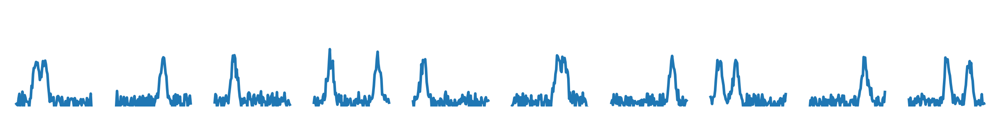

In [123]:
fig,ax=plt.subplots(ncols=10,nrows=1,figsize=(10,1))
for n in range(10):
    ax[n].plot(X[n,:])
    ax[n].set_ylim([-0.1,2])
    ax[n].axis('off')
plt.show()

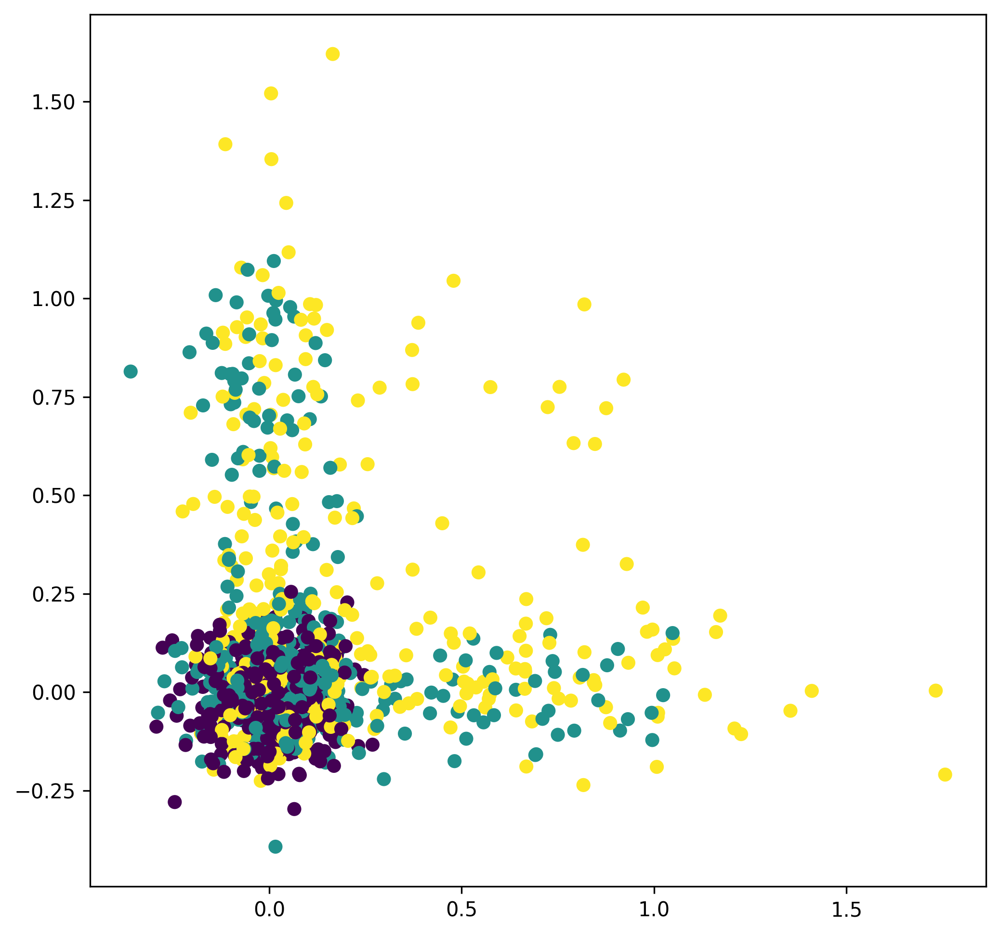

In [124]:
# plot these points in a projection into 2D space

# pick two arbitrary coordinates
j0=17
j1=35

plt.figure(figsize=(8,8))
X0=X[:,j0]
X1=X[:,j1]    
plt.scatter(X0,X1,c=Xlabel)
plt.show()

Computing pairwise distances...
perplexity = e^(3.401197)
Computing P-values for point 0 of 1000...
Computing P-values for point 500 of 1000...
Mean value of sigma: 0.790691
tries size is 1000
tries max is 23
tries min is 9
I will show 100 lines


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:131: RuntimeWarning: divide by zero encountered in log


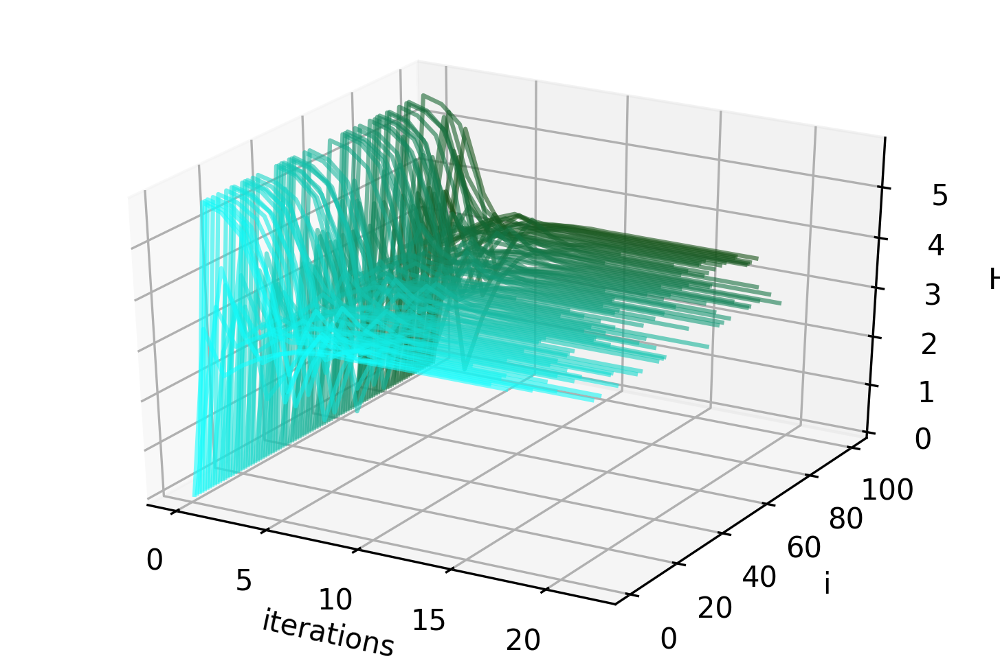

/usr/local/lib/python3.6/dist-packages/mpl_toolkits/mplot3d/proj3d.py:152: RuntimeWarning: invalid value encountered in true_divide
  txs, tys, tzs = vecw[0]/w, vecw[1]/w, vecw[2]/w


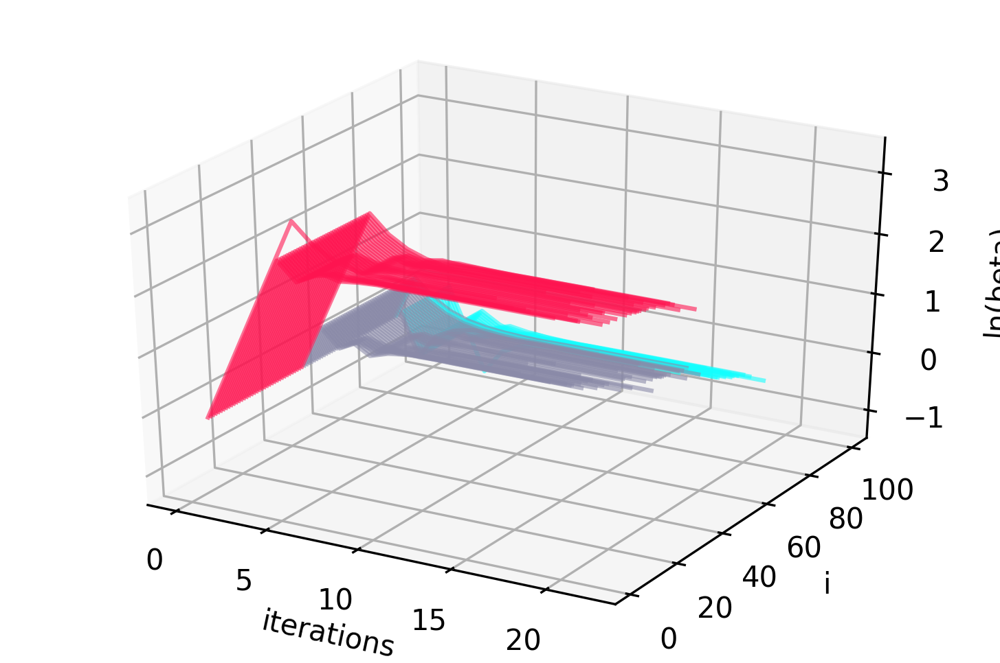

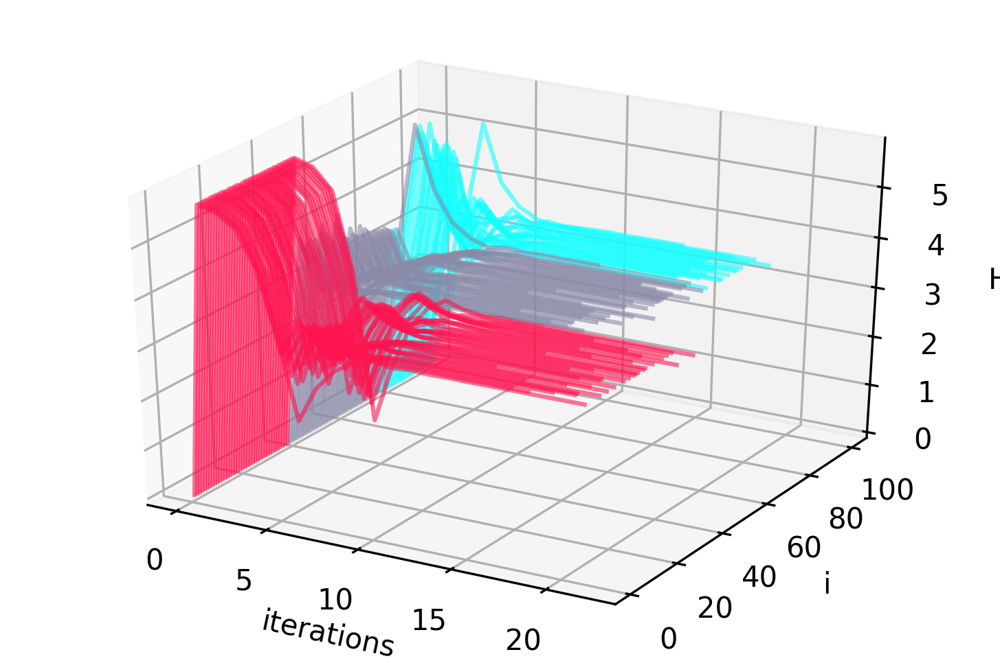

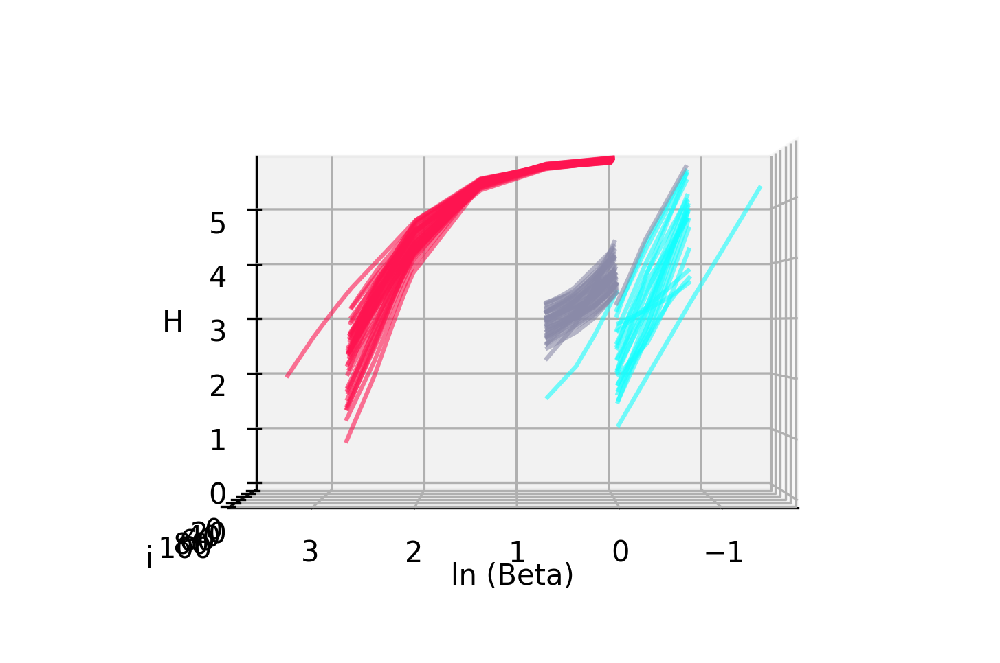

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:148: RuntimeWarning: divide by zero encountered in log
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:149: RuntimeWarning: divide by zero encountered in log


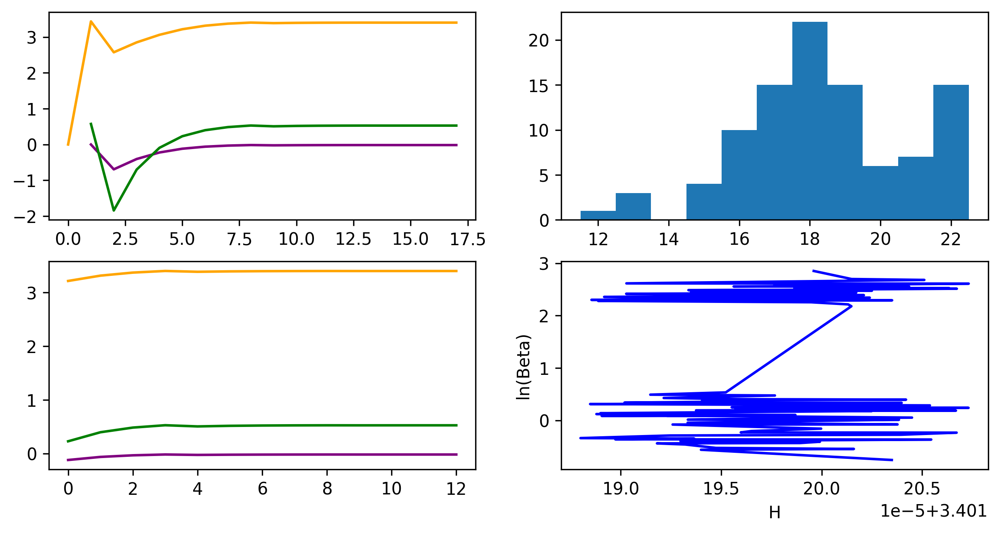

In [125]:
# now apply t-SNE to reduce to two dimensions in a smart way!
P = x2p_with_plot(X,perplexity=30, colorLabels = Xlabel)


In [126]:
target_dims = 2
Ystart = np.random.randn(N, target_dims)
picks=np.random.randint(N,size=16)
print("X.size is "+str(X.size))
print(X.shape)


X.size is 100000
(1000, 100)


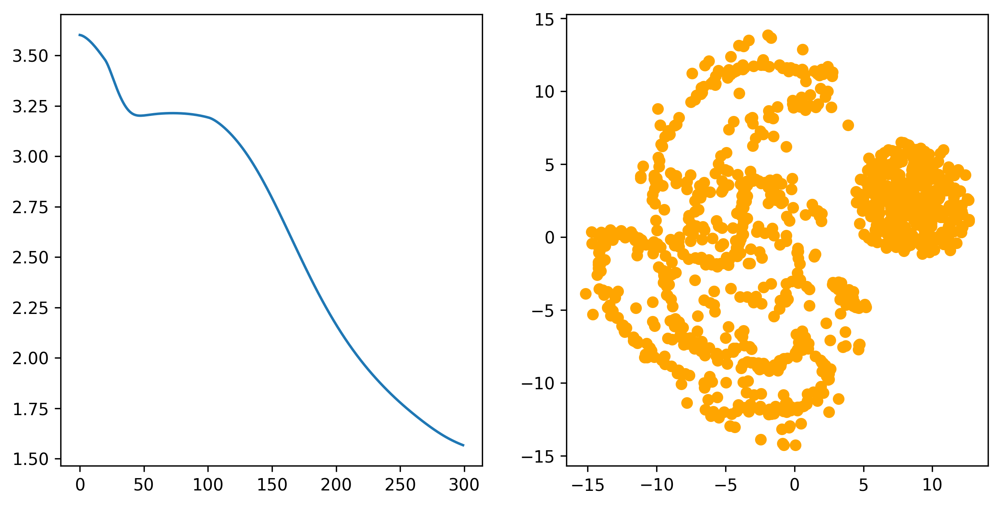

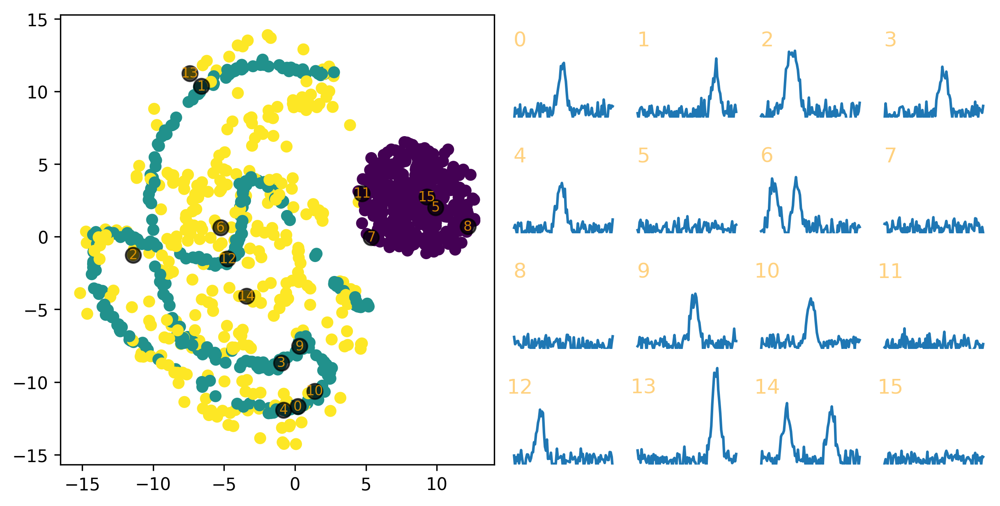

In [127]:
Y=tsne_XY(X, Y=Ystart, P=P, do_animation=True, animation_skip_steps=10, 
          eta2 = 100, max_iter=300,
          useGravityFactor=False, symmetrizeP=True)
plot_tsne_with_curves(Y[:,0],Y[:,1],X,Xlabel,random_picks = picks)

A lot better: use the gravityFactor

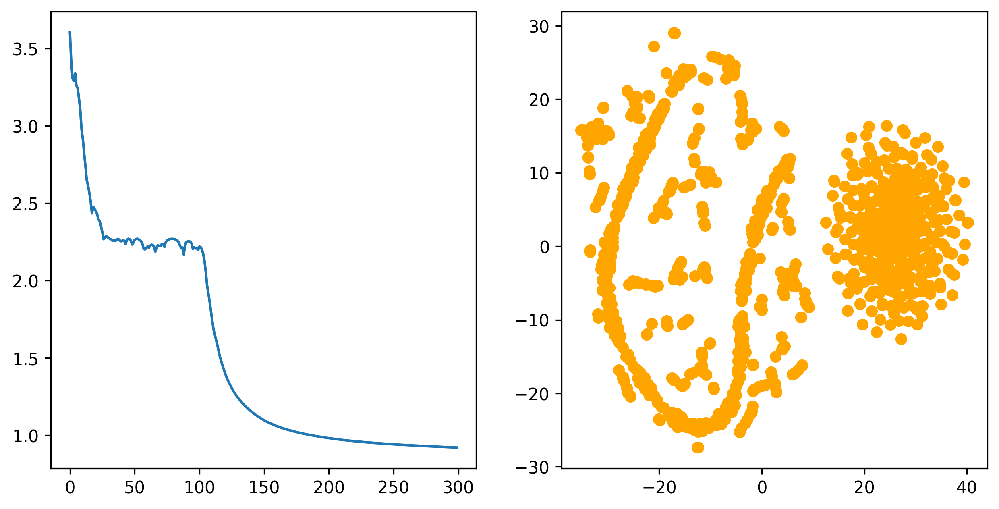

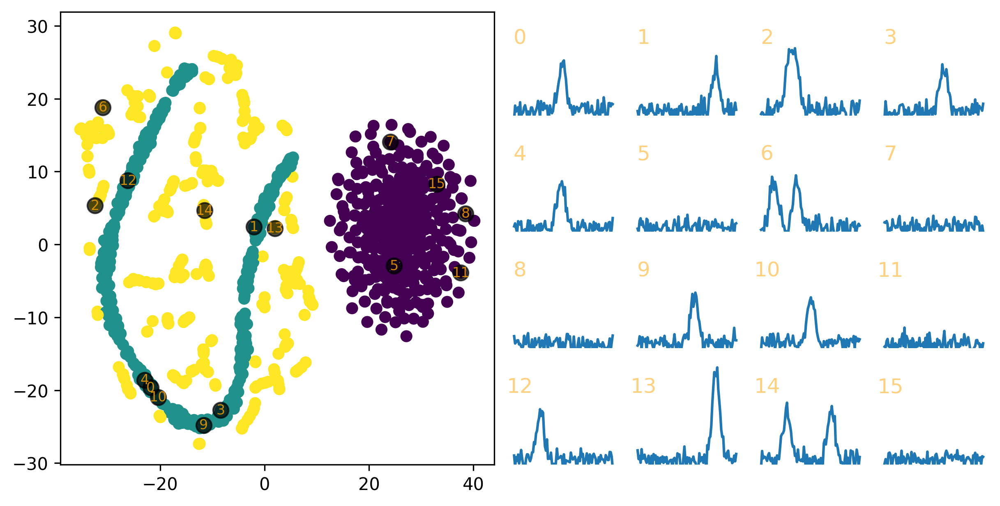

In [140]:
Y=tsne_XY(X, Y=Ystart, P=P, do_animation=True, animation_skip_steps=10,
          eta2 = 100,  max_iter=300,
          useGravityFactor=True, symmetrizeP=True)
plot_tsne_with_curves(Y[:,0],Y[:,1],X,Xlabel,random_picks = picks)

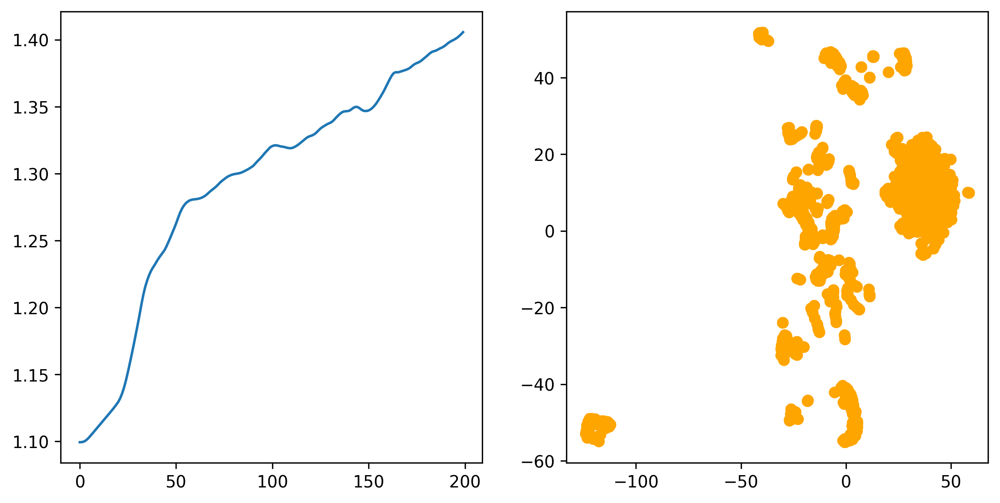

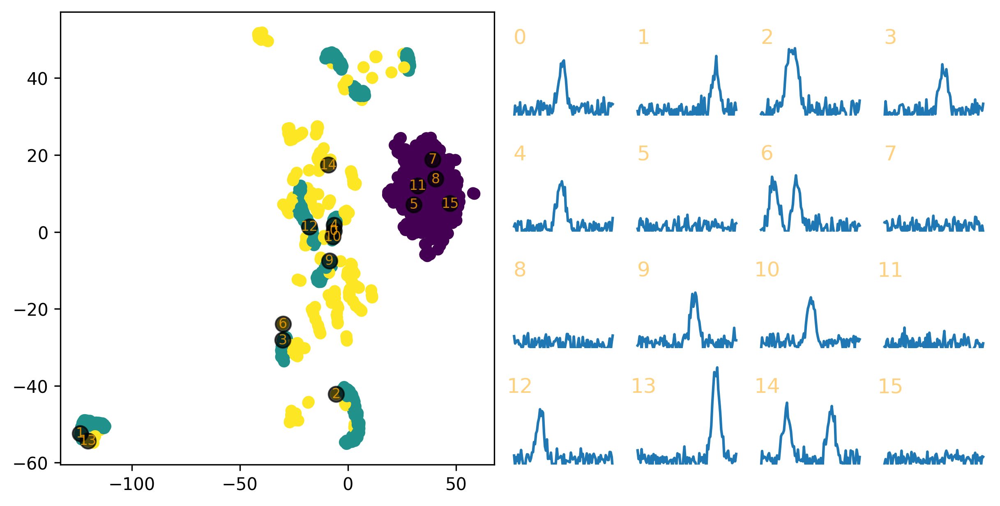

In [141]:
#refine results (use Y as a parameter for tsne_XY)
Y=tsne_XY(X, Y=Y, P=P, do_animation=True,animation_skip_steps=10,
          eta2= 100, max_iter=200, exag=[[1,1]],
          useGravityFactor=True, symmetrizeP=False, transposeP=False)
plot_tsne_with_curves(Y[:,0],Y[:,1],X,Xlabel,random_picks = picks)



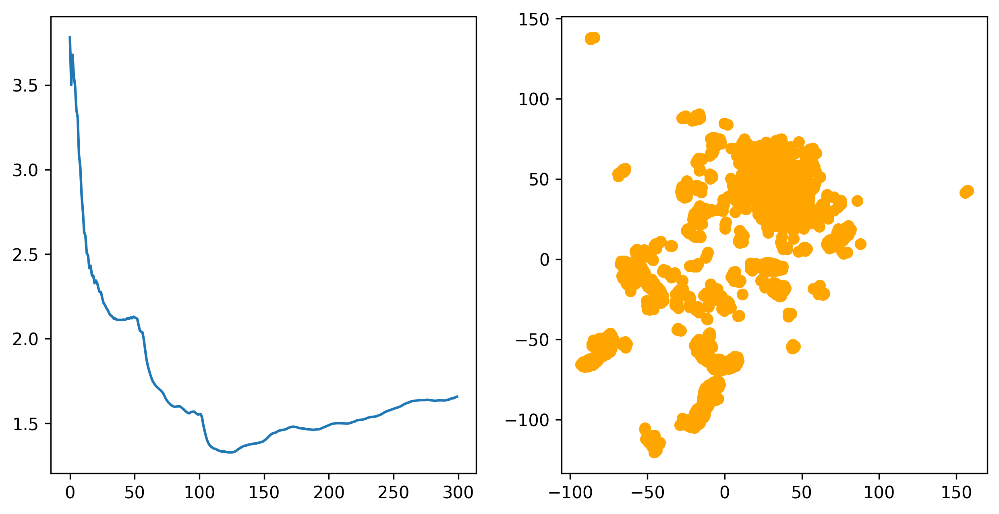

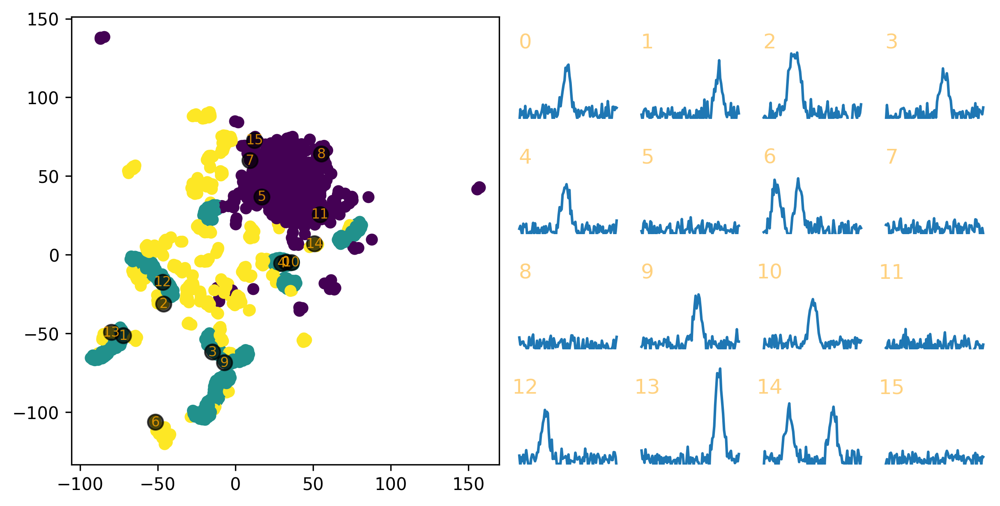

In [133]:
#start again, with new parameters
Y=tsne_XY(X, Y=Ystart, P=P, do_animation=True,animation_skip_steps=10,
          eta2= 300, max_iter=300, exag=[[4,50],[2,100]],
          useGravityFactor=True, symmetrizeP=False, transposeP=False)
plot_tsne_with_curves(Y[:,0],Y[:,1],X,Xlabel,random_picks = picks)

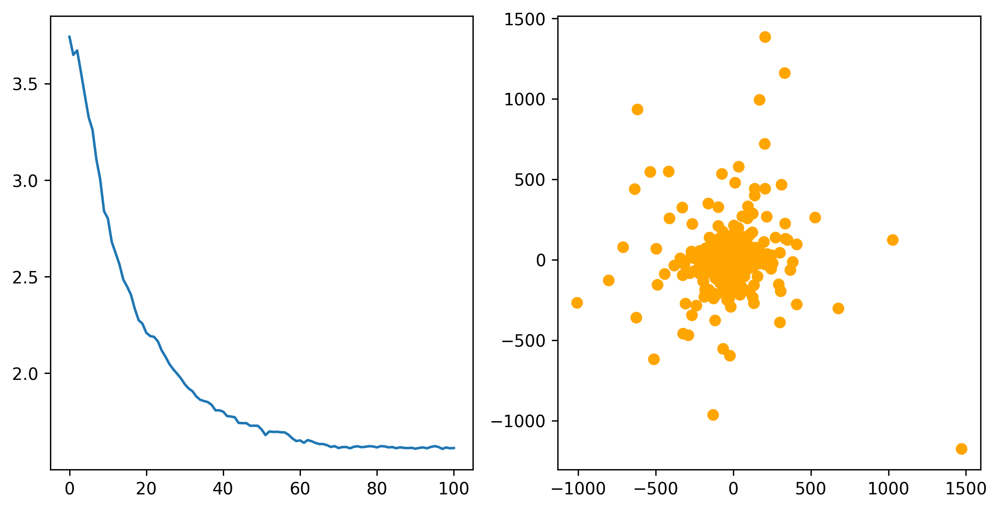

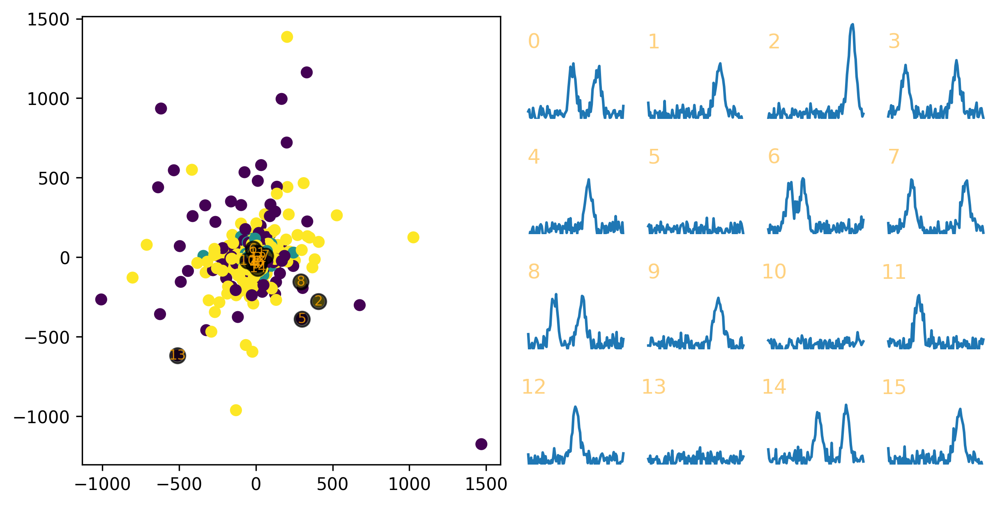

In [109]:
Y=tsne_XY(X, Y=Ystart, P=P, do_animation=True,
       animation_skip_steps=10, eta2=200, max_iter=300,
       useGravityFactor=True, symmetrizeP=False, transposeP=True)
plot_tsne_with_curves(Y[:,0],Y[:,1],X,Xlabel,random_picks = picks)

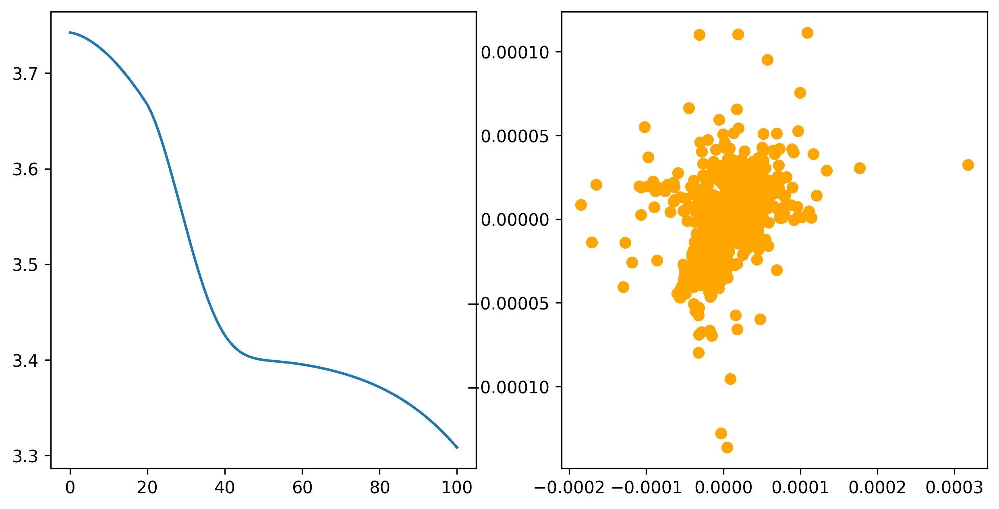

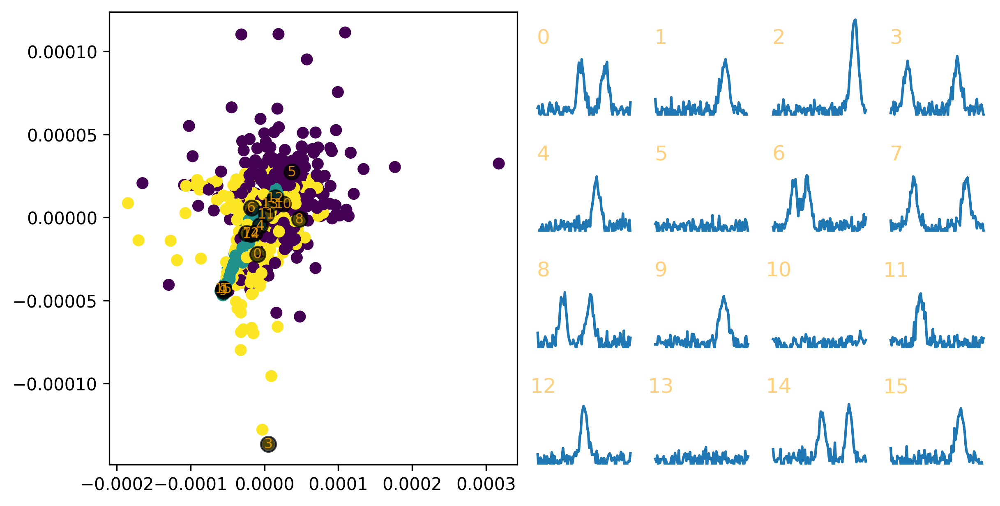

In [110]:
Y=tsne_XY(X, Y=Ystart, P=P, do_animation=True,
       animation_skip_steps=10, eta2=100, max_iter=300,
       useGravityFactor=False, symmetrizeP=False, transposeP=False)
plot_tsne_with_curves(Y[:,0],Y[:,1],X,Xlabel,random_picks = picks)

# Tutorial Exercise 1: Change the perplexity parameter in the 'Gaussian cloud' example and/or the 'multiple Gaussians' example and observe its effect!



# Tutorial Exercise 2: Modify the 'multiple Gaussians' example by inventing different sample curves

